# End-to-end Multi-class Dog Breed Classification

this notebook builds an end-to-end multi-class image classifier using TenserFlow 2.0 and TenserFlow Hub.

## 1. Poblem
Identifying the beed of a dog given the image of a dog.

## 2. Data
the data used is from Kaggle's dog breed identification competition

https://www.kaggle.com/c/dog-breed-identification/data


## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation


## 4. Features
somr information about the data:
* dealing with images(unstructured data) so it is probably best we use deep learning/transfer learning.
* there are 120 breeds of Dogs(this means there are 120 different classes).
* there are around 10,000+ images in the training set(these images have labels)
* there are around 10,000+ images in the test set(these images have no labels,as we are predicting them)

In [ ]:
#!unzip "drive/Othercomputers/My Laptop/Dog_Vision/dog-breed-identification.zip" -d "drive/Othercomputers/My Laptop/Dog_Vision"

### Get our workspace ready

In [ ]:
# Import TensorFlow into Colab and necessary tools

import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU","available(yessss!!!!)" if tf.config.list_physical_devices("GPU") else "not available:(")

TF version: 2.19.0
TF Hub version: 0.16.1
GPU not available:(


## getting our data ready(turing it into Tensors)

turing our data into tensors(numerical representation)

In [ ]:
import pandas as pd
labels_csv = pd.read_csv("drive/Othercomputers/My Laptop/Dog_Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

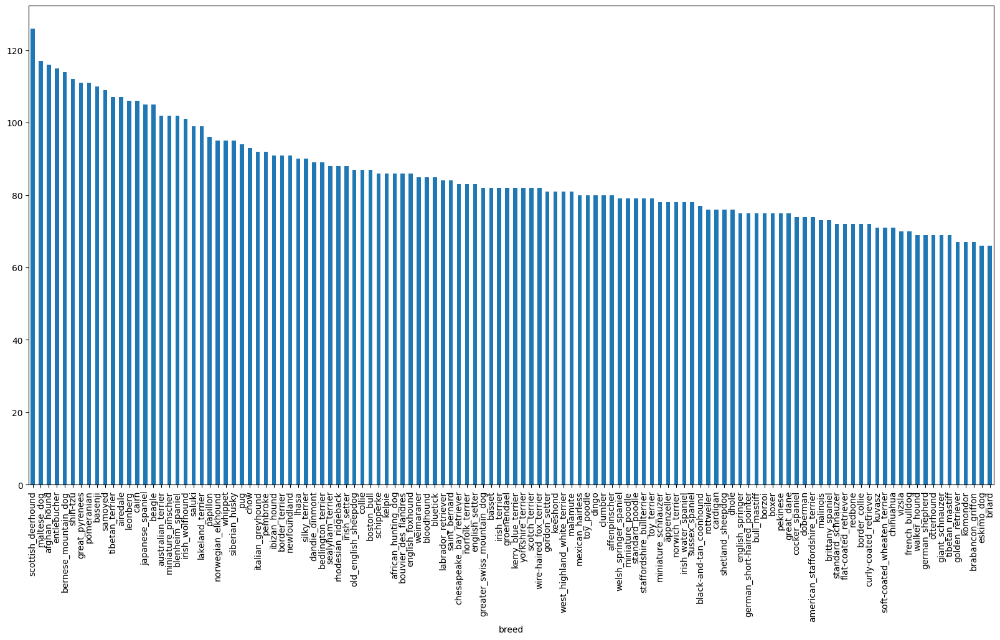

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

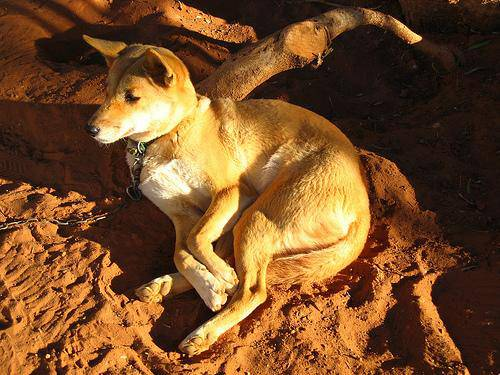

In [ ]:
from IPython.display import Image
Image("drive/Othercomputers/My Laptop/Dog_Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

## getting i mages and their labels
lest get a list of our image file pathnames

In [ ]:
# Create pathnames from image ID's
filenames = ["drive/Othercomputers/My Laptop/Dog_Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

filenames[:10]

['drive/Othercomputers/My Laptop/Dog_Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/Othercomputers/My Laptop/Dog_Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/Othercomputers/My Laptop/Dog_Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/Othercomputers/My Laptop/Dog_Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/Othercomputers/My Laptop/Dog_Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/Othercomputers/My Laptop/Dog_Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/Othercomputers/My Laptop/Dog_Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/Othercomputers/My Laptop/Dog_Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/Othercomputers/My Laptop/Dog_Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/Othercomputers/My Laptop/Dog_Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
if len(os.listdir("drive/Othercomputers/My Laptop/Dog_Vision/train/")) == len(filenames):
  print("filenames match actual amount of files!!")
else:
  print("filenames do not match the actual amount of files")

filenames match actual amount of files!!


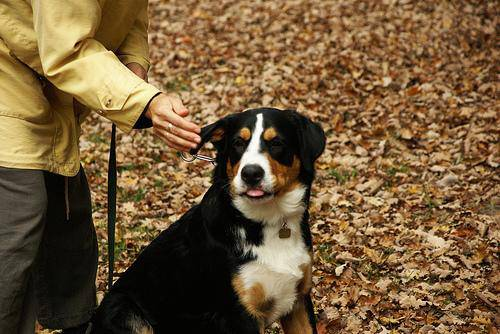

In [ ]:
Image(filenames[9544])

In [ ]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
if len(labels) == len(filenames):
  print("Number of labes matches the number of filenames!")
else:
  print("does not match")

Number of labes matches the number of filenames!


In [ ]:
# fing the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# turing every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# turing boolean arrays into integers
print(labels[0])
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## creating our own validation set

In [ ]:
# set yp x and y variables
X = filenames
Y = boolean_labels

In [ ]:
# set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# splitting our data
from sklearn.model_selection import train_test_split

# splitting into traing and validation of total size NUM_IMAGES
X_train, X_val, Y_train, Y_val = train_test_split(X[:NUM_IMAGES],
                                                  Y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state = 42)
len(X_train), len(Y_train), len(X_val), len(Y_val)

(800, 800, 200, 200)

## Preprocessing Images(Turing images into Tensors)

this function does:
1. takes an image filepath as an input
2. use TenserFlow to read the file and save it to a variable `image`
3. turn our`image`(a jpg) into Tensors
4. Resize the `image` to be a shape of (224,224)
5. return the modified `image`

In [ ]:
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
import tensorflow as tf

ResNet50 = tf.keras.applications.ResNet50
preprocess_input = tf.keras.applications.resnet50.preprocess_input
decode_predictions = tf.keras.applications.resnet50.decode_predictions


IMG_SIZE = 224

def process_image(image_path, img_size=IMG_SIZE):
    """
    Takes an image file path and turns that image into a Tensor
    preprocessed for ResNet50.
    """
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, size=[img_size, img_size])
    image = tf.keras.applications.resnet50.preprocess_input(image)  # 🔑 key line
    return image


# turning our data into batches

use because if we try to process 10000+ images in one go.....they might not fit into the memory

so we do about 32(batch size) images at a time

in order to use Tenserflow effectively, we need our data in the form of Tensor tuples:
`(image, label)`.


In [ ]:
# function to return a tuple (image, label)
def get_image_label(image_path, label):
    image = process_image(image_path)
    return image, label


dataset = tf.data.Dataset.from_tensor_slices((X, labels))


batch_size = 32
dataset = (
    dataset
    .map(get_image_label, num_parallel_calls=tf.data.AUTOTUNE)
    .shuffle(buffer_size=len(X))  # shuffle dataset
    .batch(batch_size)
    .prefetch(tf.data.AUTOTUNE)
)


In [ ]:
(process_image(X[42]), tf.constant(Y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[-2.15021973e+01,  1.64045944e+01, -4.04434662e+01],
         [-4.24387245e+01, -3.64443970e+00, -5.89822464e+01],
         [-4.30099449e+01, -2.86828613e+00, -5.81456146e+01],
         ...,
         [-2.19425583e+01,  1.55638504e+01, -4.89009857e+01],
         [-1.97116699e+01,  1.70115280e+01, -4.78894730e+01],
         [-1.87521286e+01,  1.64078751e+01, -4.84931259e+01]],
 
        [[-3.43372345e+01, -1.06492615e+00, -5.76269913e+01],
         [-3.87921677e+01, -4.40002441e+00, -6.15220070e+01],
         [-3.17770309e+01,  3.61511230e+00, -5.12858887e+01],
         ...,
         [-2.48769913e+01,  1.14347916e+01, -5.26537018e+01],
         [-2.10037384e+01,  1.34933243e+01, -5.11866989e+01],
         [-2.00011520e+01,  1.44959030e+01, -5.01841125e+01]],
 
        [[-3.81680069e+01, -1.30119781e+01, -7.02799606e+01],
         [-3.07817764e+01, -4.83159637e+00, -6.23642921e+01],
         [-2.17072754e+01,  5.46158600e+00

a function to turn all of our data into batches

In [ ]:
BATCH_SIZE = 32

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
    """
    Creates batches of data out of images (X) and label(Y) pairs.
    Shuffles the data if it's training data but doesn't shuffle if it's validation data.
    Also accepts test data as input (no labels).
    """
    # If it's test data (no labels)
    if test_data:
        print("Creating test data batches...")
        data = tf.data.Dataset.from_tensor_slices(tf.constant(X))
        data_batch = (
            data.map(process_image, num_parallel_calls=tf.data.AUTOTUNE)
            .batch(batch_size)
            .prefetch(tf.data.AUTOTUNE)
        )
        return data_batch

    # If it's validation data (no shuffle)
    elif valid_data:
        print("Creating validation data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
        data_batch = (
            data.map(get_image_label, num_parallel_calls=tf.data.AUTOTUNE)
            .batch(batch_size)
            .prefetch(tf.data.AUTOTUNE)
        )
        return data_batch

    # Otherwise it's training data
    else:
        print("Creating training data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
        data = data.shuffle(buffer_size=len(X))
        data = data.map(get_image_label, num_parallel_calls=tf.data.AUTOTUNE)
        data_batch = (
            data.batch(batch_size)
            .prefetch(tf.data.AUTOTUNE)
        )
        return data_batch


In [ ]:
train_data = create_data_batches(X_train, Y_train)
val_data = create_data_batches(X_val, Y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


## visualizing Data Batches

In [ ]:
def deprocess_resnet(x):
    """
    Undo ResNet50 preprocess_input for visualization.
    Converts back from BGR to RGB and rescales to [0,1].
    """
    if hasattr(x, "numpy"):  # handle Tensor inputs
        x = x.numpy()

    x = x.copy()
    mean = np.array([103.939, 116.779, 123.68])  # BGR mean values
    x += mean

    # Convert from BGR (ResNet50) back to RGB for matplotlib
    x = x[..., ::-1]

    # Normalize to [0,1]
    x = np.clip(x / 255.0, 0, 1)
    return x


In [ ]:
import matplotlib.pyplot as plt
def show_25_images(images, labels):
    plt.figure(figsize=(10, 10))

    for i in range(25):
        ax = plt.subplot(5, 5, i + 1)
        plt.imshow(deprocess_resnet(images[i]))  # no .numpy() here
        plt.title(unique_breeds[labels[i].argmax()])
        plt.axis("off")

    plt.show()


In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[-9.38462524e+01, -9.21397858e+01, -1.18115608e+02],
          [-1.72197952e+01, -1.51621017e+01, -4.26538315e+01],
          [-9.73637238e+01, -9.65940475e+01, -1.18724663e+02],
          ...,
          [-1.02056702e+02, -1.09464264e+02, -1.23680000e+02],
          [-1.01164261e+02, -1.05700668e+02, -1.23191154e+02],
          [-9.82180099e+01, -1.01058006e+02, -1.19959007e+02]],
 
         [[-6.82074432e+01, -6.90474396e+01, -9.59484329e+01],
          [-1.03584610e+02, -1.04471939e+02, -1.23635956e+02],
          [-8.25412292e+01, -8.44615784e+01, -1.07121506e+02],
          ...,
          [-1.03913994e+02, -1.13628990e+02, -1.23654091e+02],
          [-9.87983704e+01, -1.03647835e+02, -1.20520432e+02],
          [-9.65816650e+01, -1.01428543e+02, -1.18308914e+02]],
 
         [[-8.38153610e+01, -8.46553574e+01, -1.09133446e+02],
          [-9.75706024e+01, -1.00430664e+02, -1.21024567e+02],
          [-9.74018173e+01, -1.00227707e+02, -1.20556496e+02],
          ...,
    

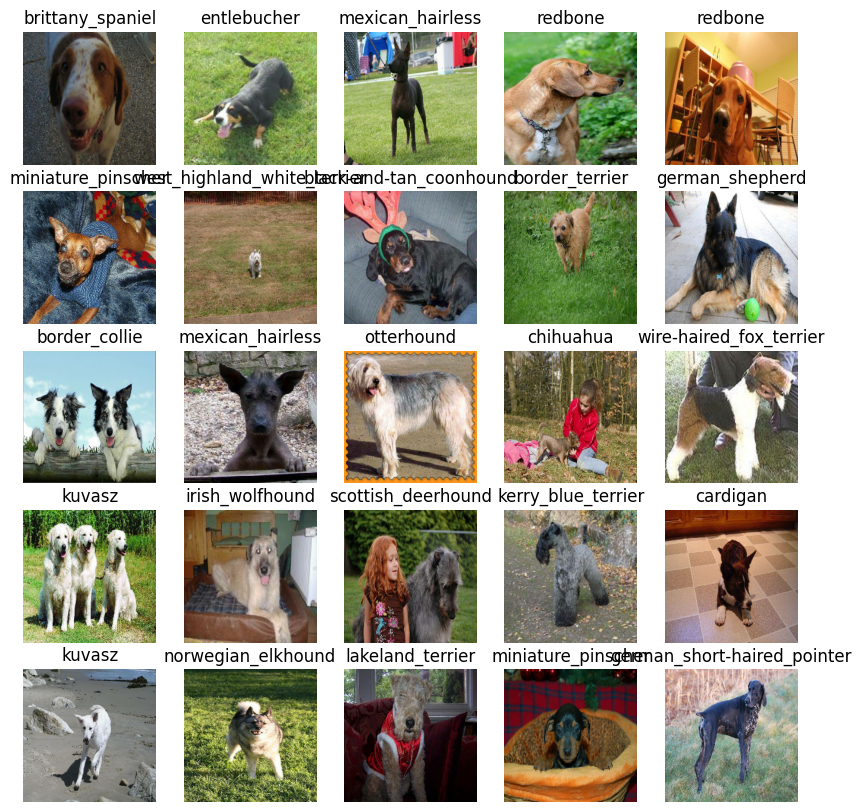

In [ ]:
show_25_images(train_images, train_labels)

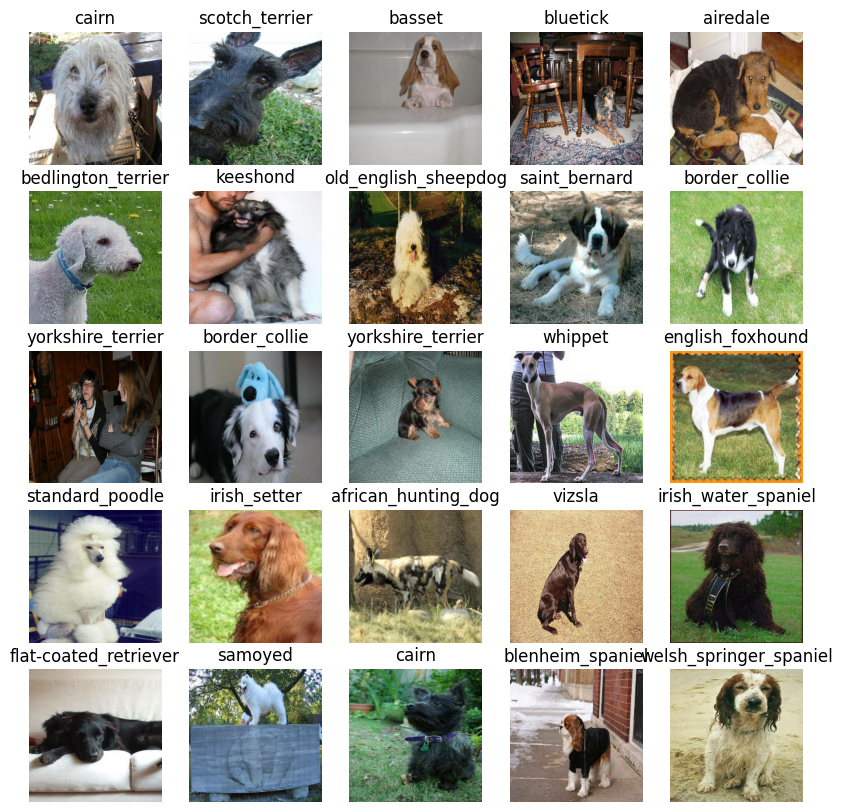

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## building a Model

(using Transfer learning)
* the input shape (our images shape, int he form of Tensors).
* the output shape (image labels, in the form of Tensors) of our model.
* the URL of the model we want to use from TenserFloe Hub https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4



In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds) # number of unique labels

# Setup model URL from TensorFlow Hub
#MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

In [ ]:


def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE):
    print("Building model using ResNet50...")

    # Create the base model and freeze it IMMEDIATELY
    base_model = tf.keras.applications.ResNet50(
        include_top=False,
        weights='imagenet',
        input_shape=(IMG_SIZE, IMG_SIZE, 3)
    )

    # FREEZE the base model (this is crucial!)
    base_model.trainable = False

    # Now build the sequential model
    model = tf.keras.Sequential([
        base_model,  # Pre-trained frozen ResNet50
        tf.keras.layers.GlobalAveragePooling2D(),
        tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax")
    ])

    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )

    return model

# Create and check the model
model = create_model()
model.summary()

Building model using ResNet50...
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 120)            │       245,880 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,833,592 (90.92 MB)

 Trainable params: 245,880 (960.47 KB)

 Non-trainable params: 23,587,712 (89.98 MB)

## Creating callbacks
callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop trsining early if a model stops improving

we'll create two callbacks, one for TensorBosrd which helps track our models progress and another for early stopping which prevents our model from training for too long

### TensorBoard Callback

To set up a TensorBoard callback and view TensorBoard in a notebook, we need to do three things:

Load the TensorBoard notebook extension.
Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
Visualize the our models training logs using the `%tensorboard` magic function (we'll do this later on).

In [ ]:
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/Othercomputers/My Laptop/Dog_Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback
helps our model from overfitting by stopping training if a certain evaluation metric stops improving

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # stops after 3 rounds of no improvements

## Training a model(on a subset)
first on only on a 1000 images

In [ ]:
print("GPU", "available (YESS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU not available :(


In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

 ### a function which trains a model. The function will:

* Create a model using create_model().
* Setup a TensorBoard callback using create_tensorboard_callback() (we do this here so it creates a log directory of the current date and time).
* Call the fit() function on our model passing it the training data, validatation data, number of epochs to train for and the callbacks we'd like to use.
* Return the fitted model.

In [ ]:
def train_model():
  model = create_model()

  tensorboard = create_tensorboard_callback()
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data = val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model

In [ ]:
model = train_model()

Building model using ResNet50...
Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 195s 7s/step - accuracy: 0.0296 - loss: 5.4719 - val_accuracy: 0.1400 - val_loss: 3.7571
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 21s 297ms/step - accuracy: 0.6057 - loss: 1.9963 - val_accuracy: 0.4050 - val_loss: 2.5210
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 167ms/step - accuracy: 0.9207 - loss: 0.6787 - val_accuracy: 0.4300 - val_loss: 2.1659
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 212ms/step - accuracy: 0.9929 - loss: 0.2652 - val_accuracy: 0.5100 - val_loss: 1.9399
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 9s 169ms/step - accuracy: 1.0000 - loss: 0.1542 - val_accuracy: 0.5100 - val_loss: 1.9071
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 268ms/step - accuracy: 1.0000 - loss: 0.0955 - val_accuracy: 0.5250 - val_loss: 1.8757
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 8s 170ms/step - accuracy: 1.0000 - loss: 0.0748 - val_accuracy: 0.5250 - val_loss: 1.8386
Epoch 8/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 234ms/step - accuracy:

### checkin the TensorBoard logs

the TensorBoard magic function`(%tensorboard)` will acess the logs diectory we created and visualize its contents

In [ ]:
%tensorboard --logdir drive/Othercomputers/My\ Laptop/Dog_Vision/logs

<IPython.core.display.Javascript object>

##Making and evaluating predictions using a trained model

In [ ]:
val_data

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# making predictions on the validation data
predictions = model.predict(val_data, verbose=1) # verbose shows us how long there is to go
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 55s 6s/step


array([[0.01588446, 0.02200564, 0.00860423, ..., 0.00205912, 0.00152945,
        0.00207483],
       [0.00661934, 0.01118903, 0.01383641, ..., 0.01042098, 0.00368058,
        0.00328519],
       [0.00412142, 0.09155864, 0.00788212, ..., 0.00074299, 0.00156156,
        0.0149033 ],
       ...,
       [0.00633297, 0.02021315, 0.00104711, ..., 0.00098301, 0.00272717,
        0.00660757],
       [0.00765755, 0.00902345, 0.01068472, ..., 0.00298589, 0.0106769 ,
        0.00463692],
       [0.02456276, 0.00702693, 0.0052818 , ..., 0.00532134, 0.00160607,
        0.00714596]], dtype=float32)

In [ ]:
np.sum(predictions[0])

np.float32(1.0)

In [ ]:
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[42])}")
print(f"Sum: {np.sum(predictions[42])}")
print(f"Max index: {np.argmax(predictions[42])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {unique_breeds[np.argmax(predictions[42])]}") # the predicted label

[0.01588446 0.02200564 0.00860423 0.01556223 0.05110156 0.00247482
 0.0010773  0.00301864 0.00183247 0.01473573 0.05155649 0.00622855
 0.00306466 0.00290929 0.00190664 0.00211895 0.02828671 0.00335373
 0.00796077 0.01943843 0.00268895 0.00747858 0.01094087 0.02122593
 0.0262209  0.00577427 0.00121669 0.00696052 0.00514916 0.00366167
 0.00382197 0.00221956 0.00375794 0.004213   0.00881682 0.00242587
 0.01705135 0.01274709 0.03027087 0.04809887 0.00704345 0.00195174
 0.00048264 0.00102822 0.00138021 0.0062426  0.05349577 0.0026244
 0.00187202 0.00903512 0.00488215 0.00211949 0.0133367  0.00055988
 0.00264926 0.00845449 0.0007231  0.00029861 0.00089812 0.00890844
 0.00159179 0.00367876 0.00091693 0.00628933 0.00568947 0.00629045
 0.00639652 0.00431249 0.00107254 0.00947575 0.00697116 0.00069593
 0.00327778 0.00502294 0.028715   0.01678189 0.00399146 0.00160871
 0.00058358 0.00876709 0.002013   0.00145956 0.00246308 0.06812656
 0.00204111 0.00314469 0.03003789 0.00542607 0.00384433 0.00463

In [ ]:
#turn prediction probabilities(confidence levels) into their respective labels
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]


pred_label = get_pred_label(predictions[81])
pred_label

'rottweiler'

In [ ]:
def unbatchify(data):
    """
    Takes a batched dataset of (image, label) Tensors and returns separate arrays
    of images and labels.
    """
    images = []
    labels = []
    original_images = []  # Store original images for display

    for image, label in data.unbatch().as_numpy_iterator():
        # Store preprocessed image (for model use)
        images.append(image)

        # Store deprocessed image (for visualization)
        deprocessed_img = deprocess_resnet(image)
        original_images.append(deprocessed_img)

        labels.append(unique_breeds[np.argmax(label)])

    return images, labels, original_images

# Update your unbatch call
val_images, val_labels, val_images_display = unbatchify(val_data)

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]


  pred_label = get_pred_label(pred_prob)


  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

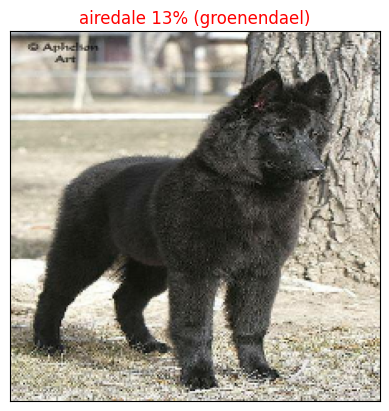

In [ ]:
plot_pred(prediction_probabilities=predictions,
         labels=val_labels,
         images=[deprocess_resnet(img) for img in val_images],
          n=45)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]


  pred_label = get_pred_label(pred_prob)

  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  top_10_pred_values = pred_prob[top_10_pred_indexes]

  top_10_pred_labels = unique_breeds[top_10_pred_indexes]


  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")


  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

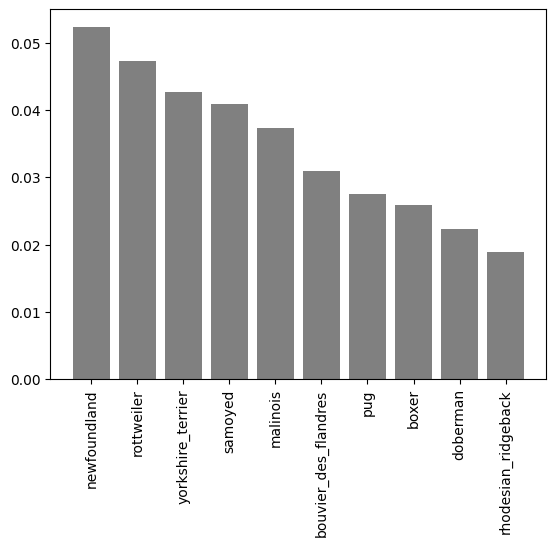

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

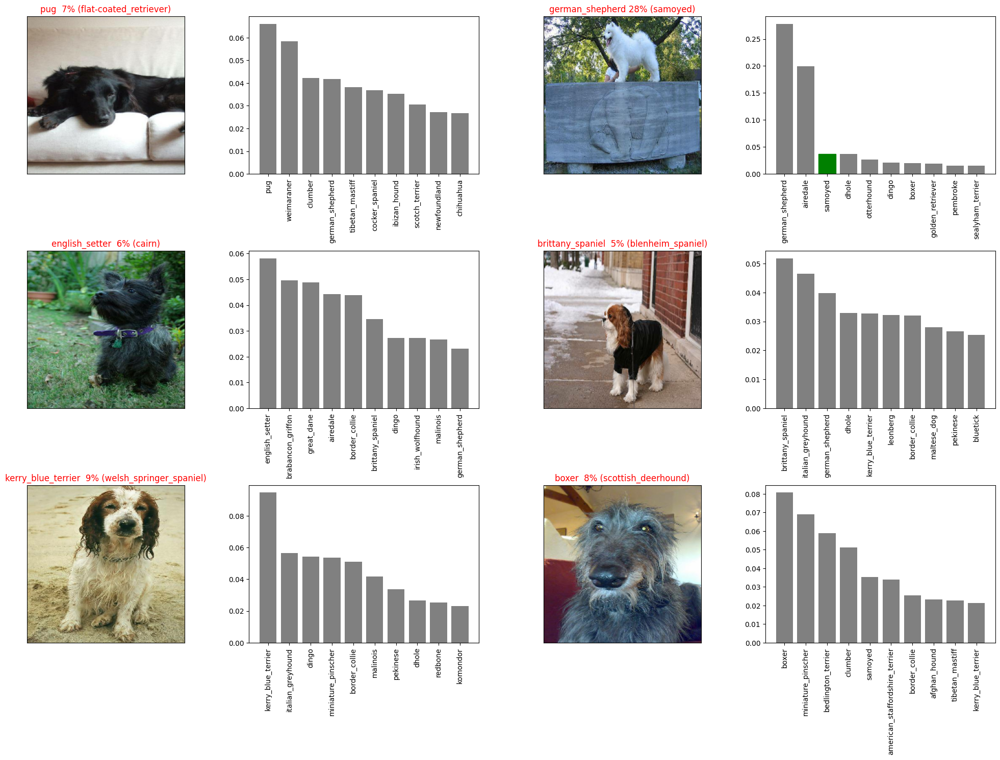

In [ ]:
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=[deprocess_resnet(img) for img in val_images],
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
def save_model(model, suffix=None):


  modeldir = os.path.join("drive/Othercomputers/My Laptop/Dog_Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):

  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
save_model(model, suffix="1000-images-Adam")

Saving model to: drive/Othercomputers/My Laptop/Dog_Vision/models/20250910-12271757507256-1000-images-Adam.h5...


'drive/Othercomputers/My Laptop/Dog_Vision/models/20250910-12271757507256-1000-images-Adam.h5'

In [ ]:
model_1000_images= load_model("drive/Othercomputers/My Laptop/Dog_Vision/models/20250909-13231757424227-1000-images-Adam.h5")

Loading saved model from: drive/Othercomputers/My Laptop/Dog_Vision/models/20250909-13231757424227-1000-images-Adam.h5


In [ ]:
model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 34s 5s/step - accuracy: 0.0050 - loss: 5.3042


[5.3721513748168945, 0.004999999888241291]

In [ ]:
model_1000_images.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 48s 6s/step - accuracy: 0.5312 - loss: 1.7817


[1.912476658821106, 0.5]

#Training a model (on the full data)

In [ ]:
len(X), len(Y)

(10222, 10222)

In [ ]:
full_data = create_data_batches(X, Y)

Creating training data batches...


In [ ]:
full_model = create_model()

Building model using ResNet50...


In [ ]:
# Create full model callbacks


full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
# Fit the full model to the full training data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,
                          full_model_early_stopping])

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 73s 195ms/step - accuracy: 0.4066 - loss: 2.7397
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - accuracy: 0.8507 - loss: 0.5160
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 84s 164ms/step - accuracy: 0.9219 - loss: 0.2817
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 82s 163ms/step - accuracy: 0.9662 - loss: 0.1632
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 79s 153ms/step - accuracy: 0.9863 - loss: 0.1017
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 84s 160ms/step - accuracy: 0.9904 - loss: 0.0724
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - accuracy: 0.9968 - loss: 0.0506
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - accuracy: 0.9980 - loss: 0.0374
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 79s 152ms/step - accuracy: 0.9991 - loss: 0.0270
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 82s 152ms/step - accuracy: 0.9983 - loss: 0.0238
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 80s 147ms/step - accuracy: 0.9984 - loss: 0.0208
Epoch 12

In [ ]:
save_model(full_model, suffix="all-images-Adam")

Saving model to: drive/Othercomputers/My Laptop/Dog_Vision/models/20250910-11031757502211-all-images-Adam.h5...


'drive/Othercomputers/My Laptop/Dog_Vision/models/20250910-11031757502211-all-images-Adam.h5'

In [ ]:
loaded_full_model = load_model('drive/Othercomputers/My Laptop/Dog_Vision/models/20250910-11031757502211-all-images-Adam.h5')

Loading saved model from: drive/Othercomputers/My Laptop/Dog_Vision/models/20250910-11031757502211-all-images-Adam.h5


## making predictions on the test dataset


In [ ]:
test_path = "drive/Othercomputers/My Laptop/Dog_Vision/test/"
test_filenames = [test_path+fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/Othercomputers/My Laptop/Dog_Vision/test/e3842312a30d2c53aaf4fc1d5990d330.jpg',
 'drive/Othercomputers/My Laptop/Dog_Vision/test/dcb9aeaf9f1a5c11e95509376d8788ca.jpg',
 'drive/Othercomputers/My Laptop/Dog_Vision/test/dfc9bcbafc1e249cd07a25c8f50384e0.jpg',
 'drive/Othercomputers/My Laptop/Dog_Vision/test/e073f14cd5f4c1a62cdb0108cca62fdd.jpg',
 'drive/Othercomputers/My Laptop/Dog_Vision/test/deb063345bf2b6752e2fe25cad096547.jpg',
 'drive/Othercomputers/My Laptop/Dog_Vision/test/deec42d608968cccb3ab91e306194fed.jpg',
 'drive/Othercomputers/My Laptop/Dog_Vision/test/e743bea73da2c0dab99ccdbc697b1ac8.jpg',
 'drive/Othercomputers/My Laptop/Dog_Vision/test/ddfe1bb4884e83421872030ac62835f1.jpg',
 'drive/Othercomputers/My Laptop/Dog_Vision/test/e176e183224bc71ce64edb44cb94688e.jpg',
 'drive/Othercomputers/My Laptop/Dog_Vision/test/e6a544a538088cc3f73b432a2da90134.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_PrefetchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)


324/324 ━━━━━━━━━━━━━━━━━━━━ 2521s 8s/step


In [ ]:
import numpy as np
np.savetxt("drive/Othercomputers/My Laptop/Dog_Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
test_predictions = np.loadtxt("drive/Othercomputers/My Laptop/Dog_Vision/preds_array.csv", delimiter=",")


In [ ]:
## Preparing test data predictions for Kaggle
import pandas as pd
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# append test image ID'S to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e3842312a30d2c53aaf4fc1d5990d330,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,dcb9aeaf9f1a5c11e95509376d8788ca,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,dfc9bcbafc1e249cd07a25c8f50384e0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e073f14cd5f4c1a62cdb0108cca62fdd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,deb063345bf2b6752e2fe25cad096547,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
#Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e3842312a30d2c53aaf4fc1d5990d330,1.431930e-09,5.288124e-06,2.299361e-06,1.785882e-06,2.003334e-08,1.353867e-07,2.774804e-08,1.216189e-08,4.254870e-07,...,7.594164e-08,5.679118e-07,4.033938e-08,4.873151e-05,1.165053e-06,5.626130e-06,6.022044e-09,1.894807e-06,1.737134e-04,6.071401e-07
1,dcb9aeaf9f1a5c11e95509376d8788ca,8.195365e-12,3.730147e-09,7.341849e-13,9.978967e-01,3.286683e-11,5.267697e-10,1.953419e-10,4.220863e-10,2.145151e-12,...,5.260094e-11,1.233227e-09,1.369334e-09,7.286855e-09,5.351843e-11,7.331063e-12,5.994589e-12,8.034812e-09,6.470095e-07,8.448532e-09
2,dfc9bcbafc1e249cd07a25c8f50384e0,3.549202e-06,9.444741e-07,8.861917e-09,1.862259e-09,7.481476e-10,6.923746e-07,9.184704e-01,6.731601e-09,1.990235e-11,...,4.000546e-06,7.054622e-06,1.906898e-09,1.638458e-10,2.160385e-10,2.742075e-07,3.687555e-07,9.023165e-09,1.415411e-07,6.106096e-02
3,e073f14cd5f4c1a62cdb0108cca62fdd,1.461606e-07,2.252793e-07,1.076031e-09,7.095976e-11,1.114925e-08,8.410571e-08,6.435661e-07,9.260203e-09,1.014156e-07,...,6.656309e-07,4.295372e-08,1.272932e-08,3.309103e-07,7.862657e-10,3.470983e-04,1.373255e-08,3.246176e-09,2.166276e-08,8.909066e-06
4,deb063345bf2b6752e2fe25cad096547,1.301516e-06,3.072077e-05,2.360714e-07,1.932450e-09,1.613867e-07,4.573002e-10,3.312130e-06,4.802155e-10,1.664118e-08,...,4.519435e-05,2.821731e-04,5.897545e-09,5.584848e-08,2.113222e-07,2.016449e-09,2.484644e-06,3.790092e-08,6.345035e-07,4.875557e-04


In [ ]:
preds_df.to_csv("drive/Othercomputers/My Laptop/Dog_Vision/full_nodel_predicitions_submission_1.csv",
                index=False)

In [ ]:
## Making predictions on custom images
custom_path = "drive/Othercomputers/My Laptop/Dog_Vision/my_dog/"
custom_image_path = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_path

['drive/Othercomputers/My Laptop/Dog_Vision/my_dog/pexels-tranmautritam-245035.jpg',
 'drive/Othercomputers/My Laptop/Dog_Vision/my_dog/pexels-helenalopes-2253275.jpg',
 'drive/Othercomputers/My Laptop/Dog_Vision/my_dog/pexels-josh-hild-1270765-17821150.jpg']

In [ ]:
custom_data = create_data_batches(custom_image_path, test_data=True)
custom_data

Creating test data batches...


<_PrefetchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
custom_preds = loaded_full_model.predict(custom_data)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['eskimo_dog', 'golden_retriever', 'bernese_mountain_dog']

In [ ]:
custom_images = []

for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)


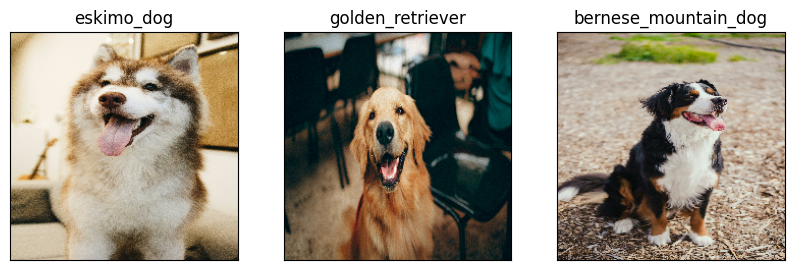

In [ ]:
# check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])

  plt.imshow(deprocess_resnet(image))
